In [1]:
import os
import numpy as np
import pandas as pd
import shutil
from read_roi import read_roi_file
import tifffile
import matplotlib.pyplot as plt
import create_mask_for_region
from datetime import datetime
from contour_visualization import *

#import shap
# read heatmap plots
#import Heatmap_plots as hmp
import seaborn as sns
import pickle
import tifffile as tiff

def flatten_extend(matrix):
    flat_list = []
    for row in matrix:
        flat_list.extend(row)
    return flat_list

In [42]:
import numpy as np

def set_transparency(rgba_img, mask):
    """
    Applies a transparency mask to an existing RGBA image.

    Parameters:
    - rgba_img: np.ndarray of shape (H, W, 4), dtype uint8
        The input RGBA image.
    - mask: np.ndarray of shape (H, W), dtype bool
        Boolean mask where True means the pixel should be transparent.

    Returns:
    - np.ndarray of shape (H, W, 4), modified RGBA image.
    """
    if rgba_img.shape[-1] != 4:
        raise ValueError("Input image must be RGBA (shape must be H x W x 4).")
    if rgba_img.shape[:2] != mask.shape:
        raise ValueError("Mask shape must match image height and width.")

    # Copy to avoid modifying the original
    result = rgba_img.copy()
    result[mask, 3] = 0  # Set alpha to 0 (transparent) where mask is True
    return result


In [56]:
# subset to target region
# make the slice move along the z position

def get_slice(z,target_site_subids,hemi = 'left',window = 60):
    ys = np.array([])
    xs = np.array([])
    if hemi == 'left':
        hemi_slice = slice(0,atlas_img.shape[2]//2)
    else:
        hemi_slice = slice(atlas_img.shape[2]//2,atlas_img.shape[2])
    for ID in target_site_subids:
        y_,x_ = np.where(atlas_img[z,:,hemi_slice] == ID)
        xs = np.concatenate([xs,x_])
        ys = np.concatenate([ys,y_])
    # find the center of mass of the OFC
    y_center = int(np.mean(ys))
    x_center = int(np.mean(xs))
    # set the slice to the center of mass of the target site
    if hemi == 'left':
        yslice = slice(y_center-window,y_center+window)
        xslice = slice(x_center-window,x_center+window)
    elif hemi == 'right':
        yslice = slice(y_center-window,y_center+window)
        xslice = slice(x_center-window + atlas_img.shape[2]//2,x_center+window + atlas_img.shape[2]//2)        
    elif hemi == 'center':
        yslice = slice(y_center-window,y_center+window)
        xslice = slice(atlas_img.shape[2]//2-window,window + atlas_img.shape[2]//2)

    return yslice,xslice

In [2]:
# set figure key
figure_key = 'Figure5'

In [3]:
# set paths
result_paths = r"\\10.159.50.7\analysis2\Ken\LSMS\Opioid"
rootpath = r"G:\My Drive\Opioid_whole_brain_manuscript"
metapath = os.path.join(rootpath,"meta")
analysis_resultpath = os.path.join(rootpath,"result")
analysis_root_figurepath = os.path.join(rootpath,"figure")
analysis_figurepath = os.path.join(analysis_root_figurepath,figure_key)
for path in [analysis_resultpath,analysis_root_figurepath,analysis_figurepath]:
    if not os.path.exists(path):
        os.mkdir(path)

# load meta info of the files
metadf = pd.read_csv(os.path.join(metapath,"OP_meta.csv"),index_col= False)
# temporary drop of A7 due to missing data
metadf = metadf[metadf.ID != 'A7'].reset_index(drop = True)
# load brain atlas to register
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)
metacolumns = ['id','acronym','parent_acronym','parent_id','structure_order']
contour_img = tifffile.imread(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\Kim_ref_adult_FP-label_v2.9_contour_map.tif")
# retrieve list of files
fnames =  [f for f in metadf.fname.values if 'DONE' in f]

In [4]:
#Conditions = metadf.Condition.unique()
# Use only morphine related groups
Conditions = ['Saline','Acute_Morphine','Chronic_Morphine','Withdrawal_Morphine','Chronic_Morphine_21','Withdrawal_Morphine_21',]
print(Conditions)

# subset the meta dataframe
metadf = metadf[metadf.Condition.isin(Conditions)]

['Saline', 'Acute_Morphine', 'Chronic_Morphine', 'Withdrawal_Morphine', 'Chronic_Morphine_21', 'Withdrawal_Morphine_21']


In [5]:
import matplotlib.pyplot as plt
import seaborn as sns
import os
from adjustText import adjust_text

# Set matplotlib parameters for white text on transparent background
plt.rcParams.update({
    'figure.facecolor': 'none',  # Transparent figure background
    'axes.facecolor': 'none',    # Transparent axes background
    'axes.edgecolor': 'black',   # White axes edge color
    'axes.labelcolor': 'black',  # White axis labels
    'xtick.color': 'black',      # White tick labels
    'ytick.color': 'black',      # White tick labels
    'legend.facecolor': 'none',  # Transparent legend background
    'legend.edgecolor': 'none',  # Transparent legend edgecolor
    'text.color': 'black',       # White text color
    'font.family':'Arial',
    'pdf.fonttype':42,
    'ps.fonttype':42,
   
})
#important for text to be detected when importing saved figures into illustrator


In [6]:
with open(os.path.join(analysis_resultpath,f'curated_acronym.pickle'), 'rb') as handle:
    curated_acronyms = pickle.load(handle)

with open(os.path.join(analysis_resultpath,f'ancestor_curated_acronym.pickle'), 'rb') as handle:
    ancestor_curated_acronyms = pickle.load(handle,)

In [7]:
default_depth = 4
# set heatmap variables
vmin= -5
vmax = 10

#Conditions = metadf.Condition.unique()
# Use only morphine related groups
Conditions = ['Saline','Acute_Morphine','Chronic_Morphine','Withdrawal_Morphine','Chronic_Morphine_21','Withdrawal_Morphine_21',]
print(Conditions)
#Condition_figure_name = ['Saline','Acute','Chronic 1 day','W.D. 1 day','Chronic 21 days','W.D. 21 days'] # changed this to betterones
Condition_figure_name = ['Saline','Acute','Chronic','Early WD','Re-exposure','Late WD'] 
Condition_color = ['gray','lime','orange','cyan','blue','purple']
# subset the meta dataframe
metadf = metadf[metadf.Condition.isin(Conditions)]

# load and subset dataframes
pivot_heatmap_df = pd.read_csv(os.path.join(analysis_resultpath,'long_pivoted_heatmap_df_with_normalized_density.csv'),index_col = 0)
pivot_heatmap_df = pivot_heatmap_df[metadf[metadf.Condition.isin(Conditions)]['ID'].values]
merge_df  = pd.read_csv(os.path.join(analysis_resultpath,'Ex_639_Ch2_stitched_long_merge_Annotated_counts_with_leaf_with_density_with_normalized_density.csv'),index_col = 0)
merge_df = merge_df[merge_df.Condition.isin(Conditions)]
# Load the acronyms for plotting
with open(os.path.join(analysis_resultpath,f'curated_acronym.pickle'), 'rb') as handle:
    curated_acronyms = pickle.load(handle)

with open(os.path.join(analysis_resultpath,f'ancestor_curated_acronym.pickle'), 'rb') as handle:
    ancestor_curated_acronyms = pickle.load(handle,)


['Saline', 'Acute_Morphine', 'Chronic_Morphine', 'Withdrawal_Morphine', 'Chronic_Morphine_21', 'Withdrawal_Morphine_21']


remove HB and CBL from the list of ancestores

In [8]:
# Update the ancestor curated acronyms so it matches the tree devisions
unique_ancestor_curated_acronyms = ['Isocortex','OLF','HPF','CTXsp','STR','PAL','TH','HY','MB',]
#unique_ancestor_curated_acronyms = ['Isocortex','OLF','HPF','CTXsp','STR','PAL','TH','HY','MB','HB','CBL']

# get a list of idx for the ancestors
ancestor_names = [atlas_df.loc[atlas_df.acronym == f,'name'].values[0] for f in unique_ancestor_curated_acronyms]
ancestor_idxs = [atlas_df.loc[atlas_df.acronym == f,'id'].values[0] for f in unique_ancestor_curated_acronyms]
'''
curated_acronyms = []
ancestor_curated_acronyms = []
for idx,i in enumerate(ancestor_idxs):
    create_mask_for_region.get_subregions(atlas_df,i,return_original = True)
    tdf = create_mask_for_region.get_subregions(atlas_df,i,return_original = True)
    curated_acronyms += list(tdf[tdf.Curated_list].acronym)
    ancestor_curated_acronyms += [unique_ancestor_curated_acronyms[idx]]*tdf[tdf.Curated_list].shape[0]

# save the new list of acronyms
with open(os.path.join(analysis_resultpath,f'curated_acronym.pickle'), 'wb') as handle:
    pickle.dump(curated_acronyms,handle,)

with open(os.path.join(analysis_resultpath,f'ancestor_curated_acronym.pickle'), 'wb') as handle:
    pickle.dump(ancestor_curated_acronyms,handle,)'''

"\ncurated_acronyms = []\nancestor_curated_acronyms = []\nfor idx,i in enumerate(ancestor_idxs):\n    create_mask_for_region.get_subregions(atlas_df,i,return_original = True)\n    tdf = create_mask_for_region.get_subregions(atlas_df,i,return_original = True)\n    curated_acronyms += list(tdf[tdf.Curated_list].acronym)\n    ancestor_curated_acronyms += [unique_ancestor_curated_acronyms[idx]]*tdf[tdf.Curated_list].shape[0]\n\n# save the new list of acronyms\nwith open(os.path.join(analysis_resultpath,f'curated_acronym.pickle'), 'wb') as handle:\n    pickle.dump(curated_acronyms,handle,)\n\nwith open(os.path.join(analysis_resultpath,f'ancestor_curated_acronym.pickle'), 'wb') as handle:\n    pickle.dump(ancestor_curated_acronyms,handle,)"

remove CBL and MB subtree from the atlas file and the merge_df

In [9]:
# remove CBL and MB subtree from the data. These regions had bad registration quality and low interest
remove_ancestor_ids = atlas_df[(atlas_df.acronym == 'HB') | (atlas_df.acronym == 'CBL')]['id'].values
remove_df = pd.concat([create_mask_for_region.get_subregions(atlas_df,idx,return_original = True) for idx in remove_ancestor_ids],axis = 0)
sub_atlas_df = atlas_df.set_index(['id']).drop(remove_df['id'].values)
merge_df = merge_df[merge_df.acronym.isin(sub_atlas_df.acronym.unique())]

set up the metacolumns to be compatible for GLM

In [10]:
# load meta info of the files
metadf['age'] = [(datetime.strptime( pday, '%m/%d/%Y') - datetime.strptime( dob, '%m/%d/%Y')).days for pday,dob in metadf.loc[:,['Date_Perfusion','DOB']].values]
atlasmeta = merge_df.reset_index().loc[merge_df.reset_index().ID =='A1',['id','parent_id','acronym','name','parent_acronym']]

#metaexog = metadf[['Condition','Sex','BW','age','Staining_Batch']]
#metacolumns = ['Saline','Acute_Morphine','Chronic_Morphine','Sex_d','Batch_d']


In [11]:
# change categorical values to dummy chategories dtypes
sex_category = pd.CategoricalDtype(categories=['F', 'M'], ordered=False)
condition_category = pd.CategoricalDtype(categories=Conditions, ordered=True)
batch_category = pd.CategoricalDtype(categories=[1,2,3,4], ordered=False)

merge_df['Sex']             = merge_df['Sex'].astype(sex_category)
merge_df['Condition']       = merge_df['Condition'].astype(condition_category)

merge_df['Staining_Batch']  = merge_df['Staining_Batch'].astype(batch_category)

# create dummy cats
condition_dummies           = pd.get_dummies(merge_df['Condition'])
sex_dummies                 = pd.get_dummies(merge_df['Sex']).loc[:,['F']].rename(columns = {'F':'Sex_d'}) # female 1
batch_dummies = pd.get_dummies(merge_df['Staining_Batch'])
batch_dummies.columns = [f'Batch_{c}_d' for c in range(4)]

merge_df                    = pd.concat([merge_df,condition_dummies,sex_dummies,batch_dummies],axis =1)

In [12]:
# add flags for conditions
#merge_df = pd.merge(merge_df,metadf[['ID','Acute_flag','Chronic_flag','Spontaneous_flag']],left_on = 'ID',right_on = 'ID')

In [13]:
# calculate effect size raw
raw_effect_size_df = merge_df[['acronym','Condition','density']].groupby(['acronym','Condition',]).mean().reset_index()\
.pivot(columns = 'Condition',index = 'acronym',values = 'density')

C:\Users\stuberadmin\AppData\Local\Temp;\ipykernel_40500\3994839575.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  raw_effect_size_df = merge_df[['acronym','Condition','density']].groupby(['acronym','Condition',]).mean().reset_index()\


In [14]:
atlas_df.loc[atlas_df.acronym.isin(curated_acronyms),['acronym','name']].to_csv(os.path.join(metapath,'clean_curated_acronyms.csv'),index = False)

Prepare heatmaps into a dictionary format

In [15]:
# read an annotated atlas file
atlas_img = tifffile.imread(r"\\10.159.50.7\Analysis2\Ken\LSMS\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\Kim_ref_adult_FP-label_v4.0.tif")

# Prepare the heatmap_da

In [16]:
# read the file names
fnamelist = np.load(os.path.join(analysis_resultpath,'fnamelist.npy'),)
# sort the data frame
metadf = metadf.set_index('fname').loc[fnamelist,:]

In [17]:
# read the heatmap array
import dask.array as da

# write as zarr array to os.path.join(analysis_resultpah,'heatmap_array.zarr')
heatmap_da = da.from_zarr(os.path.join(r"\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos",'heatmap_array'), mode="r")

In [18]:
# read the heatmap array
import dask.array as da

# write as zarr array to os.path.join(analysis_resultpah,'heatmap_array.zarr')
adjusted_heatmap_da = da.from_zarr(os.path.join(r"\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos\result",'adjusted_brain_heatmap.zarr'), mode="r")

# Plotting preditive activity map

In [40]:
pannel_key = 'B'

In [21]:
figure_key

'Figure5'

In [23]:
import create_mask_for_region

In [24]:
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)

conduct analysis of PFC distribution

In [27]:
# target site can be experiment specific
target_site_acronym = 'A24a (IL)'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [28]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [31]:
subset_heatmap = np.reshape(heatmap_da,[metadf.shape[0]] + list(atlas_img.shape)).compute()

In [33]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(metadf.shape[0])])


c:\Users\stuberadmin\anaconda3\envs\scanpy_py\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\stuberadmin\anaconda3\envs\scanpy_py\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [34]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [36]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [37]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [38]:
# subset to target region
xslice = slice(325,325+120)
yslice = slice(160,160+120)

In [51]:
get_slice(curated_zplane,target_site_subids,hemi= 'right')

(slice(482, 602, None), slice(282, 402, None))

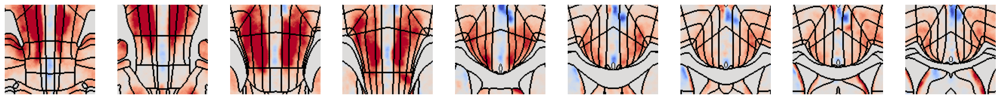

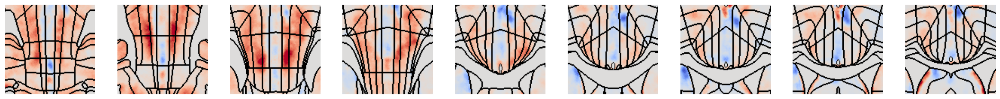

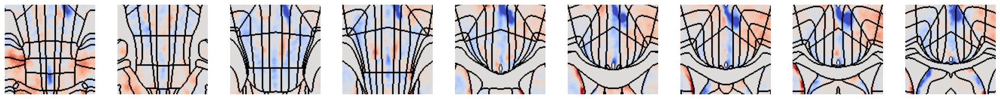

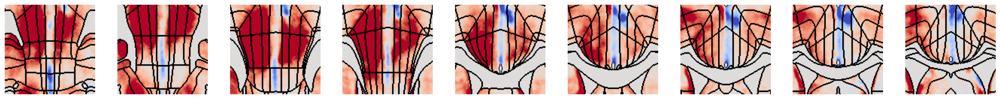

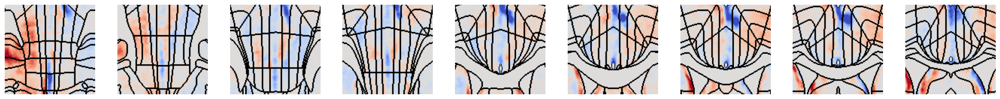

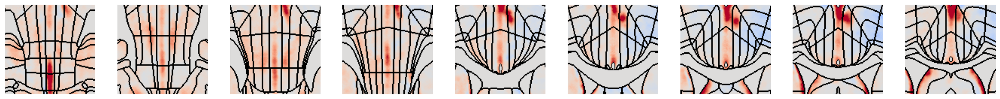

In [59]:

for condition in Conditions[1:] + ['constant']:
    theatmap = np.load(os.path.join(r"\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos\result",f'{condition}_betas.npy'))
    __,overlayed_image = overlap_contour(theatmap,contour_img,\
    cmin =  -15, cmax = 15,\
    outputpath = None)
    fig,axs = plt.subplots(1,len(z_unique[::5]),figsize = (3*len(z_unique[::5]),3),sharey = True)
    fig.subplots_adjust(wspace=0.25, hspace=0.3)

    for idx, curated_zplane in enumerate(z_unique[::5]):
        ax = axs[idx]
        yslice,xslice = get_slice(curated_zplane,target_site_subids,hemi= 'center')
        ax.imshow(overlayed_image[curated_zplane,yslice,xslice])
        

        trans_img = set_transparency(overlayed_image[z_unique[::5][idx],:,:], (atlas_img==0)[z_unique[::5][idx],:,:])
        ax.imshow(trans_img[yslice,xslice])
        ax.axis('off')
        ax.set_title('')
        ax.set_ylabel(condition,color = 'black')
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{condition}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{condition}.pdf'),bbox_inches='tight',dpi = 512)

In [60]:
pannel_key = 'C'

In [61]:
import create_mask_for_region

In [62]:
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)

conduct analysis of Acb distribution

In [63]:
# target site can be experiment specific
target_site_acronym = 'Acb'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [64]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [65]:
subset_heatmap = np.reshape(heatmap_da,[metadf.shape[0]] + list(atlas_img.shape)).compute()

In [66]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(metadf.shape[0])])


c:\Users\stuberadmin\anaconda3\envs\scanpy_py\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\stuberadmin\anaconda3\envs\scanpy_py\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [67]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [68]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [69]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [70]:
# subset to target region
xslice = slice(325,325+120)
yslice = slice(160,160+120)

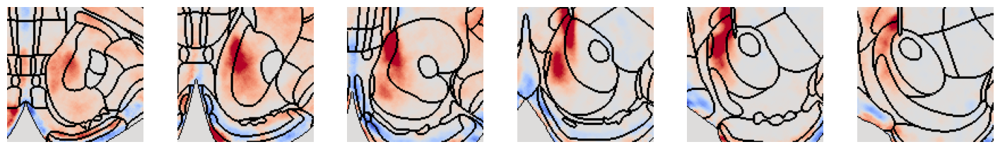

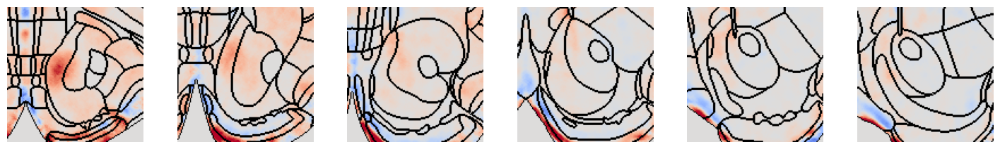

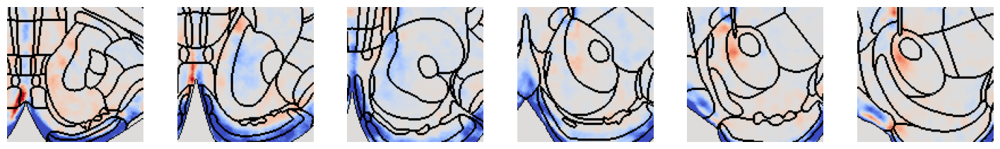

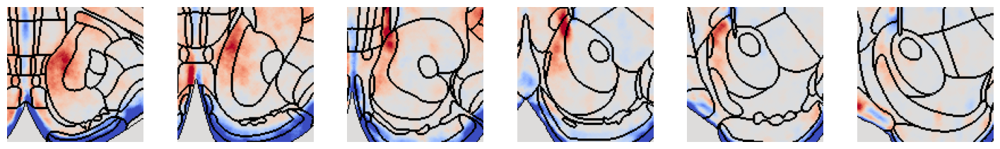

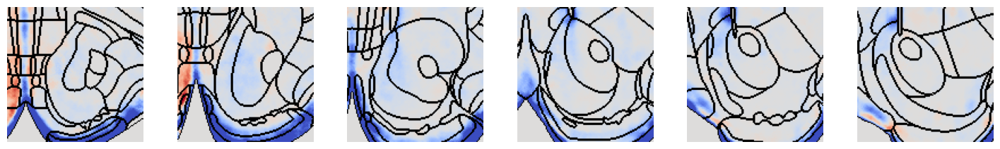

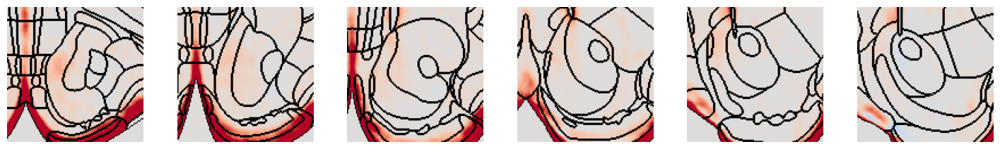

In [71]:

for condition in Conditions[1:] + ['constant']:
    theatmap = np.load(os.path.join(r"\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos\result",f'{condition}_betas.npy'))
    __,overlayed_image = overlap_contour(theatmap,contour_img,\
    cmin =  -15, cmax = 15,\
    outputpath = None)
    fig,axs = plt.subplots(1,len(z_unique[::5]),figsize = (3*len(z_unique[::5]),3),sharey = True)
    fig.subplots_adjust(wspace=0.25, hspace=0.3)

    for idx, curated_zplane in enumerate(z_unique[::5]):
        ax = axs[idx]
        yslice,xslice = get_slice(curated_zplane,target_site_subids,hemi= 'right')
        ax.imshow(overlayed_image[curated_zplane,yslice,xslice])
        

        trans_img = set_transparency(overlayed_image[z_unique[::5][idx],:,:], (atlas_img==0)[z_unique[::5][idx],:,:])
        ax.imshow(trans_img[yslice,xslice])
        ax.axis('off')
        ax.set_title('')
        ax.set_ylabel(condition,color = 'black')
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{condition}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{condition}.pdf'),bbox_inches='tight',dpi = 512)

In [72]:
pannel_key = 'D'

In [73]:
figure_key

'Figure5'

In [74]:
import create_mask_for_region

In [75]:
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)

conduct analysis of PFC distribution

In [76]:
# target site can be experiment specific
target_site_acronym = 'Ce'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [77]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [78]:
subset_heatmap = np.reshape(heatmap_da,[metadf.shape[0]] + list(atlas_img.shape)).compute()

In [79]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(metadf.shape[0])])


c:\Users\stuberadmin\anaconda3\envs\scanpy_py\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\stuberadmin\anaconda3\envs\scanpy_py\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [80]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [81]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [82]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [83]:
# subset to target region
xslice = slice(325,325+120)
yslice = slice(160,160+120)

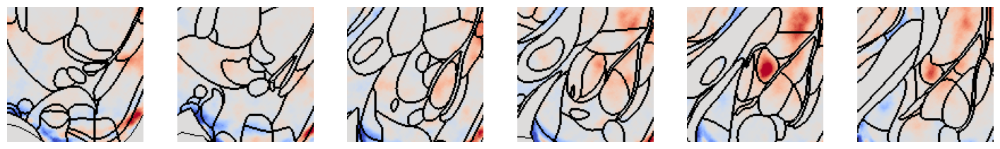

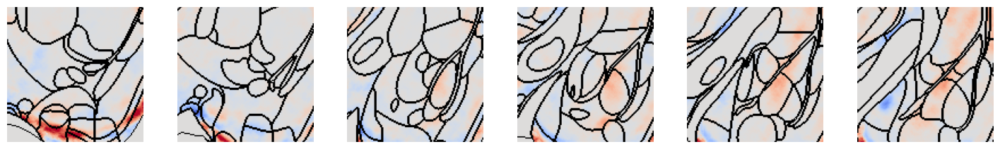

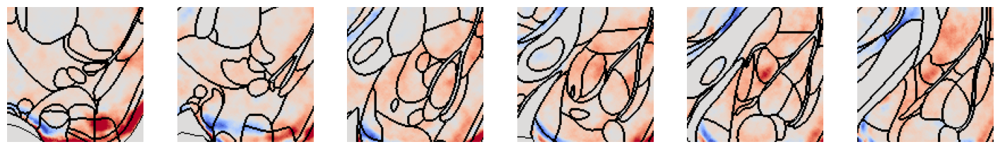

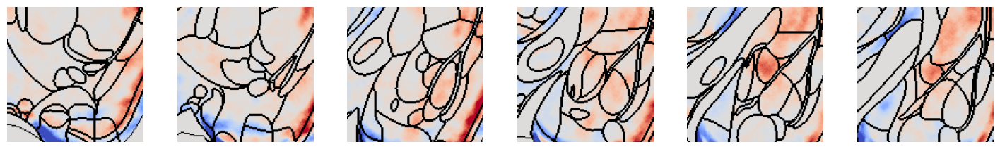

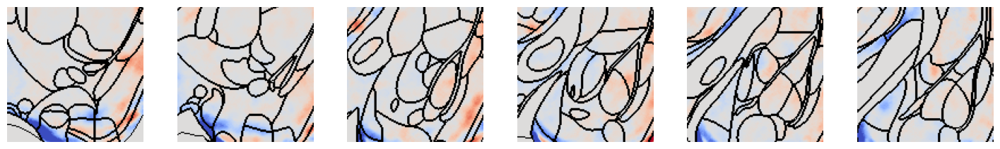

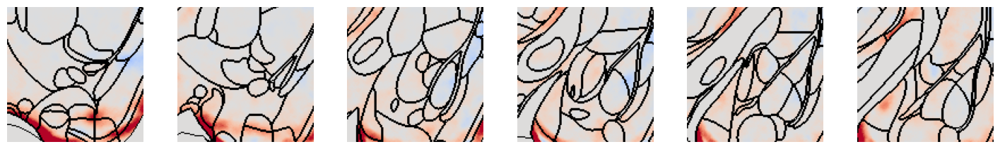

In [85]:

for condition in Conditions[1:] + ['constant']:
    theatmap = np.load(os.path.join(r"\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos\result",f'{condition}_betas.npy'))
    __,overlayed_image = overlap_contour(theatmap,contour_img,\
    cmin =  -15, cmax = 15,\
    outputpath = None)
    fig,axs = plt.subplots(1,len(z_unique[::5]),figsize = (3*len(z_unique[::5]),3),sharey = True)
    fig.subplots_adjust(wspace=0.25, hspace=0.3)

    for idx, curated_zplane in enumerate(z_unique[::5]):
        ax = axs[idx]
        yslice,xslice = get_slice(curated_zplane,target_site_subids,hemi= 'right')
        ax.imshow(overlayed_image[curated_zplane,yslice,xslice])
        

        trans_img = set_transparency(overlayed_image[z_unique[::5][idx],:,:], (atlas_img==0)[z_unique[::5][idx],:,:])
        ax.imshow(trans_img[yslice,xslice])
        ax.axis('off')
        ax.set_title('')
        ax.set_ylabel(condition,color = 'black')
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{condition}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{condition}.pdf'),bbox_inches='tight',dpi = 512)

# Semi-nmf

The semi-nnmf analysis was conducted using a modified code from the Lindermann lab

The main codes are in the folder below

C:\Users\stuberadmin\fos

The results are saved in this iteration of factorization

\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos\spatial_clustering_results\2025_04_02-12_34

In [17]:
factor_resultspath = r"\\10.159.50.7\LabCommon\Ken\data\Opioid_cFos\spatial_clustering_results\2025_04_02-12_34"

In [23]:
from scipy.io import loadmat
# read the params matrics
# read params.mat and params.pkl
params_mat = os.path.join(factor_resultspath,'params.mat')
params_pkl = os.path.join(factor_resultspath,'params.pkl')
# read the params.mat file
params = loadmat(params_mat)


In [25]:
# read factors and loadings from the semi-nnmf result
factors = params['factors']
count_loadings = params['count_loadings']

In [46]:
# convert the loadings into a dataframe
count_loadings_df = pd.DataFrame(params['count_loadings'],columns = [f'factor_{idx}' for idx in range(params['count_loadings'].shape[1])])
# merge with metadf
count_loadings_df = count_loadings_df.join(metadf.reset_index()['Condition'])

# convert the loadings dataframe to stacked
stack_count_loadings_df = count_loadings_df.set_index('Condition').stack().reset_index().rename(columns = {'level_1':'factor',0:'weights'})

# spatial factor

The factors are stored in a zarr array

In [98]:
# read the zarr file as a dask.array
factors_da = da.from_zarr(os.path.join(factor_resultspath, "factors.zarr"))
factors_da

dask.array<from-zarr, shape=(22, 87750000), dtype=float32, chunksize=(1, 87750000), chunktype=numpy.ndarray>

# Statistical analysis to specify factors to focus

To specify the factors to analyze, we conduct a one-way anova for the loadings in each factor, followed by a multiple comparison correction

In [48]:
import pandas as pd
import numpy as np
from scipy import stats
from statsmodels.stats.multitest import multipletests

# Create a results DataFrame to store ANOVA results
results = []

# Get unique factors
factors = stack_count_loadings_df['factor'].unique()

# Store raw p-values for multiple testing correction
raw_p_values = []

# For each factor, perform ANOVA
for factor in factors:
    # Subset data for current factor
    factor_data = stack_count_loadings_df[stack_count_loadings_df['factor'] == factor]
    
    # Get all conditions except Saline
    conditions = [c for c in factor_data['Condition'].unique() if c != 'Saline']
    
    # Perform one-way ANOVA
    groups = [factor_data[factor_data['Condition'] == 'Saline']['weights'].values]
    for condition in conditions:
        groups.append(factor_data[factor_data['Condition'] == condition]['weights'].values)
    
    # Perform ANOVA
    f_stat, p_value = stats.f_oneway(*groups)
    raw_p_values.append(p_value)
    
    # Store results with placeholder for corrected p-value
    results.append({
        'factor': factor,
        'f_statistic': f_stat,
        'p_value': p_value,
        'significant_comparisons': []  # Will be filled after multiple testing correction
    })

# Convert results to DataFrame
results_df = pd.DataFrame(results)

# Perform multiple testing correction on ANOVA p-values
reject, pvals_corrected, _, _ = multipletests(raw_p_values, method='fdr_bh')

# Add corrected p-values to results DataFrame
results_df['corrected_p_value'] = pvals_corrected

# Now perform post-hoc tests only for factors with significant corrected p-values
for idx, row in results_df.iterrows():
    if row['corrected_p_value'] < 0.05:  # Using corrected p-value for decision
        factor = row['factor']
        factor_data = stack_count_loadings_df[stack_count_loadings_df['factor'] == factor]
        conditions = [c for c in factor_data['Condition'].unique() if c != 'Saline']
        
        significant_comparisons = []
        for condition in conditions:
            # Perform t-test between Saline and current condition
            saline_data = factor_data[factor_data['Condition'] == 'Saline']['weights'].values
            condition_data = factor_data[factor_data['Condition'] == condition]['weights'].values
            t_stat, p_val = stats.ttest_ind(saline_data, condition_data)
            
            if p_val < 0.05:
                significant_comparisons.append(f"Saline-{condition} (p={p_val:.4f})")
        
        # Update the significant comparisons in the results DataFrame
        results_df.at[idx, 'significant_comparisons'] = significant_comparisons

# Display results
print("\nANOVA Results:")
print(results_df)

# Print significant findings
print("\nSignificant Findings:")
for _, row in results_df.iterrows():
    if row['corrected_p_value'] < 0.05:
        print(f"\nFactor {row['factor']}:")
        print(f"ANOVA p-value: {row['p_value']:.4f}")
        print(f"Corrected p-value: {row['corrected_p_value']:.4f}")
        print("Significant comparisons with Saline:")
        for comp in row['significant_comparisons']:
            print(f"  - {comp}")

# write the results file
results_df.to_csv(os.path.join(analysis_resultpath,'factor_anova_stat_df.csv'),index = False)


ANOVA Results:
       factor  f_statistic       p_value  \
0    factor_0     8.652788  1.672465e-05   
1    factor_1    11.606709  8.718547e-07   
2    factor_2     6.247591  2.702418e-04   
3    factor_3    13.555140  1.551865e-07   
4    factor_4     1.703753  1.580422e-01   
5    factor_5     1.604639  1.830488e-01   
6    factor_6     0.957420  4.562097e-01   
7    factor_7     0.637761  6.722451e-01   
8    factor_8     1.296683  2.863781e-01   
9    factor_9     1.100780  3.765439e-01   
10  factor_10     0.061831  9.972468e-01   
11  factor_11     0.248684  9.378192e-01   
12  factor_12     0.594658  7.041028e-01   
13  factor_13     0.860264  5.167872e-01   
14  factor_14     1.386556  2.517535e-01   
15  factor_15     0.765560  5.805171e-01   
16  factor_16     4.294486  3.517789e-03   
17  factor_17     0.361542  8.714560e-01   
18  factor_18     0.226914  9.484681e-01   
19  factor_19     0.316703  8.997636e-01   
20  factor_20     0.237326  9.434780e-01   
21  factor_21   

In [49]:
# get the rejected factors
rejected_factor_idx = results_df.loc[results_df.corrected_p_value<0.05,'factor'].index
print(rejected_factor_idx)

Index([0, 1, 2, 3, 16], dtype='int64')


# Figure G, I and supplemental figure D, F, H

C:\Users\stuberadmin\AppData\Local\Temp;\ipykernel_27860\2825076620.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=factor_data,
C:\Users\stuberadmin\AppData\Local\Temp;\ipykernel_27860\2825076620.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.pointplot(data=factor_data,
C:\Users\stuberadmin\AppData\Local\Temp;\ipykernel_27860\2825076620.py:61: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs.set_xticklabels(Condition_figure_name, rotation=-45)
C:\Users\stuberadmin\AppData\Local\Temp;\ipykernel_27860\2825076620.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and wi

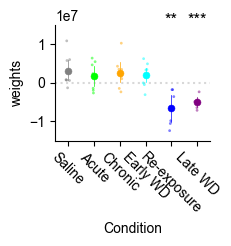

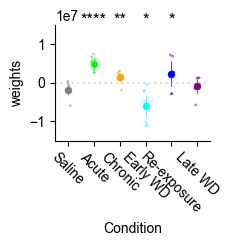

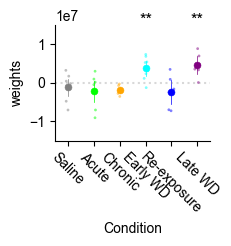

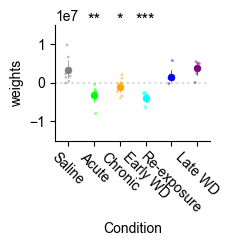

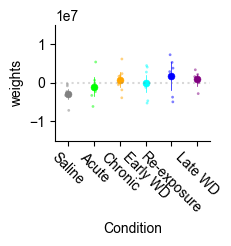

...

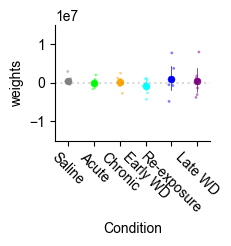

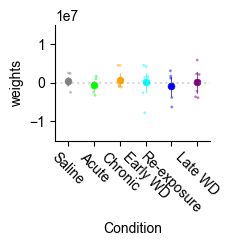

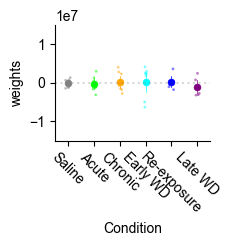

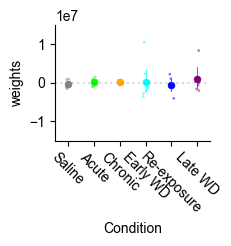

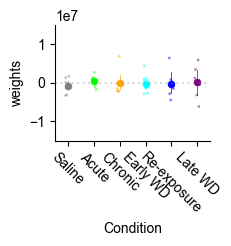

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Create directory for plots if it doesn't exist
tfigurepath = os.path.join(analysis_figurepath, 'factors_by_condition')
if not os.path.exists(tfigurepath):
    os.mkdir(tfigurepath)

# Get unique factors from results_df
factors = results_df['factor'].unique()

def get_stars(p_value):
    """Return the appropriate number of stars based on p-value"""
    if p_value < 0.0001:
        return '****'
    elif p_value < 0.001:
        return '***'
    elif p_value < 0.01:
        return '**'
    elif p_value < 0.05:
        return '*'
    return ''

for factor in factors:
    # Create figure
    fig, axs = plt.subplots(1, 1, figsize=(2, 1.5))
    
    # Get the data for current factor
    factor_data = stack_count_loadings_df[stack_count_loadings_df.factor == factor]
    
    # Create strip plot
    sns.stripplot(data=factor_data,
                  y='weights',
                  x='Condition',
                  ax=axs,
                  palette=Condition_color,
                  order=Conditions,
                  alpha=0.5,
                  size=2)
    
    # Create point plot
    sns.pointplot(data=factor_data,
                  y='weights',
                  x='Condition',
                  palette=Condition_color,
                  order=Conditions,
                  ax=axs,
                  markers="o",
                  markersize=5,
                  linestyle="none",
                  linewidth=0.5)
    
    # Set y-axis limits
    axs.set_ylim(-1.5E+07, 1.5E+07)
    
    # Add horizontal line at y=0
    axs.axhline(0, ls=':', color='gray', alpha=0.3)
    
    # Set x-axis labels
    axs.set_xticklabels(Condition_figure_name, rotation=-45)
    
    # Get significant comparisons for this factor
    significant_comps = results_df[results_df['factor'] == factor]['significant_comparisons'].iloc[0]
    
    # Add stars for significant comparisons
    if significant_comps:  # If there are any significant comparisons
        for comp in significant_comps:
            # Extract condition name and p-value from the comparison string
            condition = comp.split('-')[1].split(' ')[0]  # Gets the condition name from "Saline-Condition (p=...)"
            p_value = float(comp.split('p=')[1].split(')')[0])  # Gets the p-value from "Saline-Condition (p=0.xxxx)"
            
            # Find the x position of this condition
            x_pos = Conditions.index(condition)
            
            # Get the appropriate number of stars
            stars = get_stars(p_value)
            
            # Add stars above the condition
            if stars:  # Only add if there are stars to show
                axs.text(x_pos, axs.get_ylim()[1] * 0.95, stars, 
                        ha='center', va='bottom', fontsize=12)
    
    # Remove spines
    sns.despine()
    
    # Save the figure
    fig.savefig(os.path.join(tfigurepath, f'{factor}.png'), dpi=216, bbox_inches='tight')
    fig.savefig(os.path.join(tfigurepath, f'{factor}.pdf'), dpi=216, bbox_inches='tight')
    


# Fiugre F and supplemental figure B

In [52]:
ave_stack_count_loadings_df = stack_count_loadings_df.groupby(['Condition','factor']).mean().reset_index().pivot(columns = 'factor',index = 'Condition',values = 'weights')
ave_stack_count_loadings_df = ave_stack_count_loadings_df.loc[Conditions,[f'factor_{idx}' for idx in range(22)]]

In [55]:
pannel_key = 'F'
figure_key = 'Figure5'

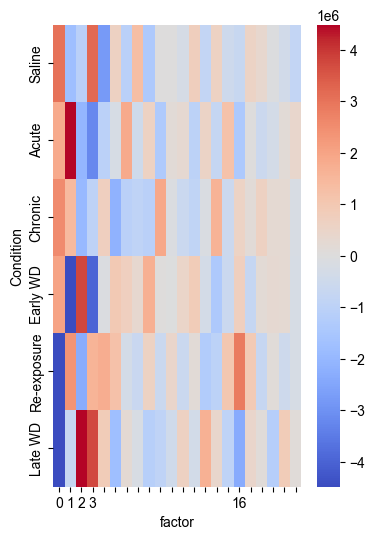

In [60]:
vmax = abs(params['count_loadings']).max()
fig,axs = plt.subplots(1,1,figsize = (4,6))
sns.heatmap(data = ave_stack_count_loadings_df, cmap="coolwarm",vmin = -vmax//3,vmax = vmax//3,ax = axs)
axs.set_xticks(np.array(range(22)) + 0.5)
# make a list for the xticks labels
# for idx in range(22) not in rejected_factor_idx, make it to '', otherwise use the factor name
xticks_labels = ['' for idx in range(22)]
for idx in rejected_factor_idx:
    xticks_labels[idx] = f'{idx}'
axs.set_xticklabels(xticks_labels,rotation = 0)
axs.set_yticklabels(Condition_figure_name,rotation = 90)
fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}.png'),dpi= 216,bbox_inches = 'tight')
fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}.pdf'),dpi= 216,bbox_inches = 'tight')

In [ ]:
pannel_key = 'F'
figure_key = 'Figure5-supplemental figure 1'



In [93]:
idx_drugs = np.array([np.where(np.array(Conditions) == drug)[0][0] for drug in metadf.Condition.values])

perm = np.argsort(idx_drugs)
bounds = np.cumsum(np.bincount(idx_drugs))-0.5
yticks = [np.cumsum(np.bincount(idx_drugs))[fidx] - f/2 -0.5 for fidx,f in enumerate(np.bincount(idx_drugs))]
best_num_factors = 22

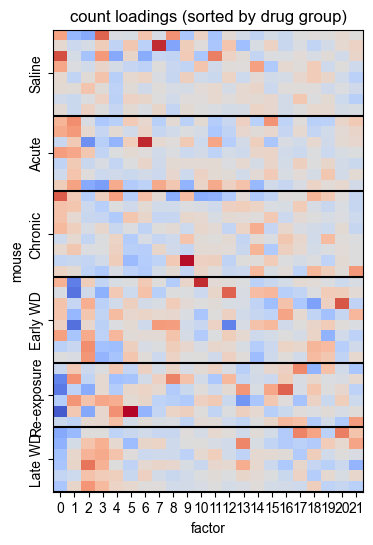

In [94]:
loadings = params['count_loadings']

fig,axs = plt.subplots(1,1,figsize= (4,6))
axs.imshow(loadings[perm], vmin=-vmax, vmax=vmax, cmap="coolwarm", aspect="auto", interpolation="none")
for bound in bounds:
    axs.axhline(bound, color='k')
_ = axs.set_xticks(np.arange(best_num_factors))

axs.set_xlabel("factor")
axs.set_ylabel("mouse")
axs.set_title("count loadings (sorted by drug group)")
#plt.colorbar()
axs.set_yticks(yticks)
axs.set_yticklabels(Condition_figure_name,rotation = 90, va = 'center')
fig.savefig(os.path.join(analysis_figurepath, f"{figure_key}{pannel_key}.png"), dpi=300,bbox_inches = 'tight')
fig.savefig(os.path.join(analysis_figurepath, f"{figure_key}{pannel_key}.pdf"), dpi=300,bbox_inches = 'tight')


# Figure 5-supplemental figure 1 C

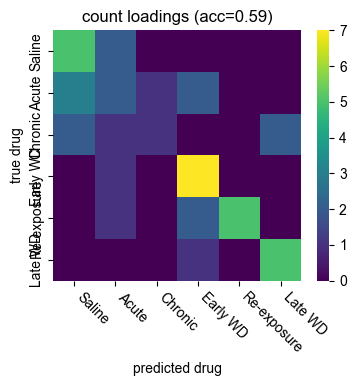

In [97]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV, cross_val_predict
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import KFold

import warnings
warnings.filterwarnings("ignore")

# normalize weights and factors
def normalize_weights(weights):
    U = weights
    U = U - U.mean()
    U /= U.std()
    return(U)

def downstream_task(W, drugs, **kwargs):
    """
    kwargs
    ------
    cv: pass in the same CV splitter for both the grid search and the confusion matrix
    """
#     W_norm = normalize_weights(W)
    W_norm = W
    parameters = {"C":10 ** np.linspace(-15,15,num=31)}
    lr = LogisticRegression()
    gridsearch = GridSearchCV(lr, parameters, **kwargs)
    gridsearch.fit(W_norm, drugs)
    drug_clf_acc = gridsearch.best_score_
    classifier = gridsearch.best_estimator_
    drugs_pred = cross_val_predict(classifier, W_norm, y=drugs, **kwargs)
    confusion_mat = confusion_matrix(drugs, drugs_pred)
    return(classifier, drug_clf_acc, confusion_mat)


pannel_key = 'C'
figure_key = 'Figure5-supplemental figure 1'
features = np.hstack([normalize_weights(params['count_loadings']),
                      ])
cv = KFold(shuffle=True, random_state=0)
clf, acc, cmat = downstream_task(features, metadf.Condition.values, cv=cv)


fig,axs = plt.subplots(1,1,figsize = (4,3.25))
sns.heatmap(cmat,ax = axs,cmap = 'viridis')
axs.set_title("count loadings (acc={:.2f})".format(acc))
axs.set_ylabel("true drug")
axs.set_xlabel("predicted drug")
#plt.colorbar(axs.images[0], ax=axs)

axs.set_xticks(np.array(range(len(Conditions))) + 0.5, Condition_figure_name, rotation=-45, ha='left')
axs.set_yticks(np.array(range(len(Conditions))) + 0.5, Condition_figure_name)

fig.savefig(os.path.join(analysis_figurepath, f"{figure_key}{pannel_key}.png"), dpi=216,bbox_inches = 'tight')
fig.savefig(os.path.join(analysis_figurepath, f"{figure_key}{pannel_key}.pdf"), dpi=216,bbox_inches = 'tight')



# Figure H, J, supplemental figure 1 A, E, G, I

In [99]:
pannel_key = 'H'
figure_key = 'Figure5'

In [100]:
# pre selected zplanes
curated_zplanes = [84,104,117,153,186,220]

In [101]:
import numpy as np

def set_transparency(rgba_img, mask):
    """
    Applies a transparency mask to an existing RGBA image.

    Parameters:
    - rgba_img: np.ndarray of shape (H, W, 4), dtype uint8
        The input RGBA image.
    - mask: np.ndarray of shape (H, W), dtype bool
        Boolean mask where True means the pixel should be transparent.

    Returns:
    - np.ndarray of shape (H, W, 4), modified RGBA image.
    """
    if rgba_img.shape[-1] != 4:
        raise ValueError("Input image must be RGBA (shape must be H x W x 4).")
    if rgba_img.shape[:2] != mask.shape:
        raise ValueError("Mask shape must match image height and width.")

    # Copy to avoid modifying the original
    result = rgba_img.copy()
    result[mask, 3] = 0  # Set alpha to 0 (transparent) where mask is True
    return result


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB dat

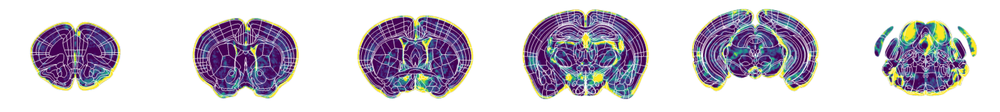

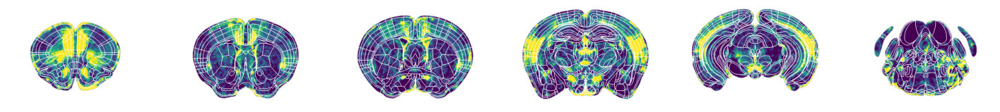

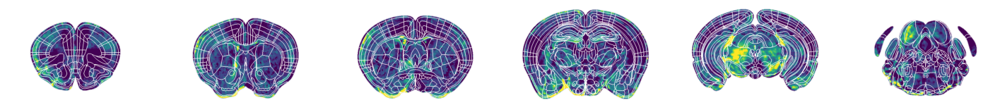

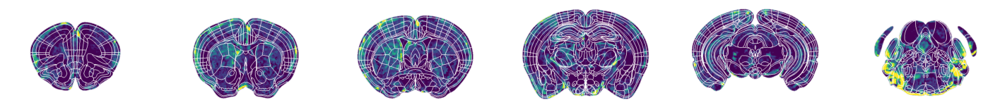

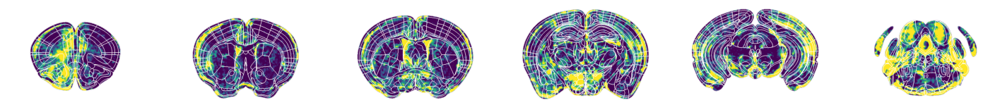

...

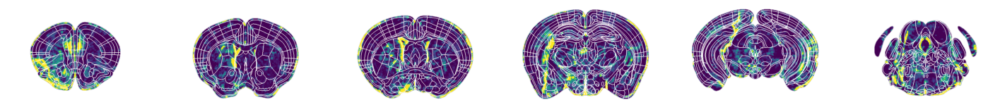

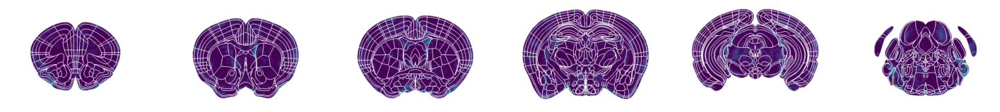

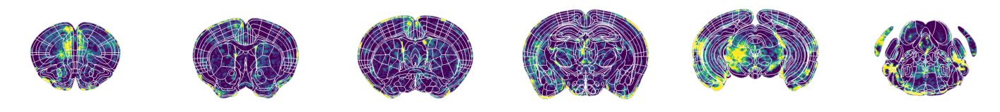

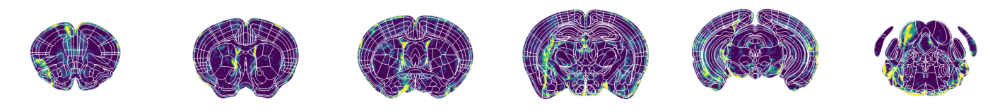

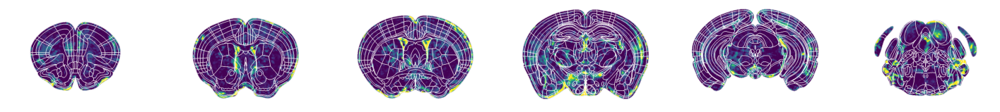

In [106]:
import contour_visualization2 as cv2
# plot every 10 zplanes
# slice for visualization
imy_slice = slice(25,425)
imx_slice = slice(50,600)

for factor_idx in range(22):
    theatmap = factors_da[factor_idx,:].reshape(atlas_img.shape)

    fig,axs = plt.subplots(1,len(curated_zplanes),figsize = (3*len(curated_zplanes),3),sharey = True)
    fig.subplots_adjust(wspace=0.25, hspace=0.3)

    for idx,ax in enumerate(axs):
        formatted_idx = f"{curated_zplanes[idx]:04}" 
        
        __,overlayed_image = cv2.overlap_contour(theatmap,contour_img,\
        cmin =  0, cmax = 0.00015,\
        outputpath = None,colormap = plt.cm.viridis)
        trans_img = set_transparency(overlayed_image[curated_zplanes[idx],:,:], (atlas_img==0)[curated_zplanes[idx],:,:])
        ax.imshow(trans_img[imy_slice,imx_slice])
        ax.axis('off')
        ax.set_title('')
        ax.set_ylabel(condition,color = 'black')
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{factor_idx}.png'),bbox_inches='tight',dpi = 1024)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{factor_idx}.svg'),bbox_inches='tight',dpi = 1024)

# Figure 5: spatial analysis of NAc

In [107]:
import create_mask_for_region

In [108]:
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)

conduct analysis of NAc distribution

In [109]:
# target site can be experiment specific
target_site_acronym = 'Acb'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [110]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [111]:
subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()

In [112]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
# append spatial_c

In [113]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [114]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [115]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [121]:
# subset to NAc region
xslice = slice(325,325+120)
yslice = slice(240,240+120)

In [123]:
pannel_key = 'L'

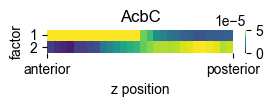

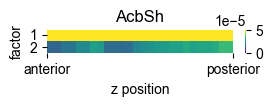

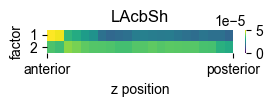

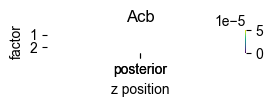

In [124]:
for  idx,sub_acronym in enumerate(target_site_subacronyms):
    sub_factors = [1,2]
    #tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
    tarray = spatial_cell_count_for_subregion[sub_factors,idx,:]
    tarray = tarray[:,~np.isnan(tarray[0,:])]


    fig,axs = plt.subplots(1,1,figsize = (3,0.3))
    sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-5)
    axs.set_title(sub_acronym)
    axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
    axs.set_yticklabels(sub_factors,rotation = 0)
    axs.set_xticks([0,tarray.shape[1]])
    axs.set_xticklabels(['anterior','posterior'])    
    axs.set_ylabel('factor')
    axs.set_xlabel('z position')
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{sub_acronym}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{sub_acronym}.pdf'),bbox_inches='tight',dpi = 512)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the 

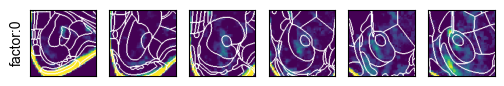

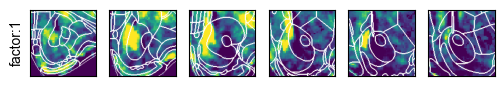

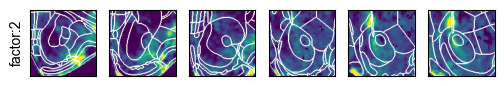

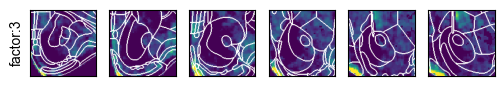

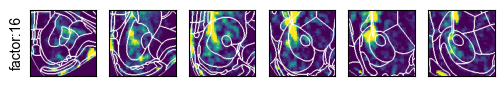

In [133]:
# plot the spatial distribution of starter cells for each subject
pannel_key = 'K'


for cidx, rejected_factor in enumerate(rejected_factor_idx):
    fig, axs = plt.subplots(1, len(z_unique[::5]), figsize=(len(z_unique[::5])*1.0, 1), sharex=True,sharey = True)
    theatmap = factors_da[rejected_factor,:].reshape(atlas_img.shape).compute()
    __,overlayed_image = cv2.overlap_contour(theatmap[:,:,::-1],contour_img,\
        cmin =  0, cmax = 0.00015,\
        outputpath = None,colormap= plt.cm.viridis)
    for idx, curated_zplane in enumerate(z_unique[::5]):
        ax = axs[idx]
        ax.imshow(overlayed_image[curated_zplane,yslice,xslice])
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks
        #ax.axis('off')
        if idx == 0:
            ax.set_ylabel(f'factor:{rejected_factor}', color='black', )
        else:
            ax.set_ylabel('', color='black',)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{rejected_factor}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{rejected_factor}.pdf'),bbox_inches='tight',dpi = 512)

# Figure 5: spatial analysis of Ce

In [134]:
import create_mask_for_region

In [135]:
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)

conduct analysis of Ce distribution

In [136]:
# target site can be experiment specific
target_site_acronym = 'Ce'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [137]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [138]:
subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()

In [139]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
# append spatial_c

In [140]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [141]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [142]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [144]:
# subset to Ce region
xslice = slice(420,420+120)
yslice = slice(245,245+120)

In [146]:
pannel_key = 'N'

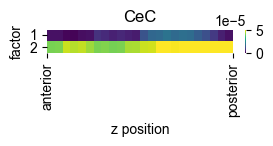

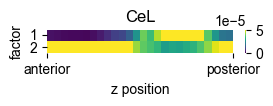

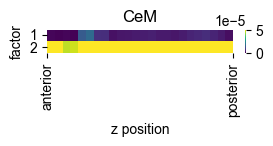

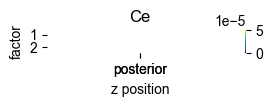

In [147]:
for  idx,sub_acronym in enumerate(target_site_subacronyms):
    sub_factors = [1,2]
    #tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
    tarray = spatial_cell_count_for_subregion[sub_factors,idx,:]
    tarray = tarray[:,~np.isnan(tarray[0,:])]


    fig,axs = plt.subplots(1,1,figsize = (3,0.3))
    sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-5)
    axs.set_title(sub_acronym)
    axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
    axs.set_yticklabels(sub_factors,rotation = 0)
    axs.set_xticks([0,tarray.shape[1]])
    axs.set_xticklabels(['anterior','posterior'])    
    axs.set_ylabel('factor')
    axs.set_xlabel('z position')
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{sub_acronym}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{sub_acronym}.pdf'),bbox_inches='tight',dpi = 512)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the 

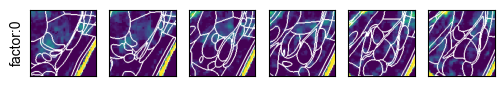

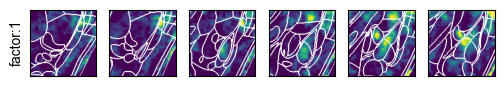

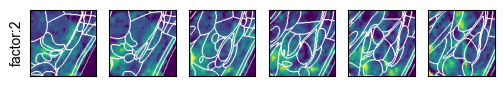

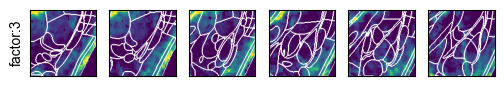

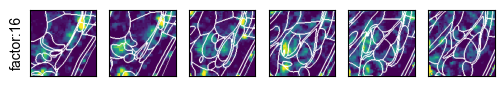

In [149]:
# plot the spatial distribution of starter cells for each subject
pannel_key = 'M'


for cidx, rejected_factor in enumerate(rejected_factor_idx):
    fig, axs = plt.subplots(1, len(z_unique[::5]), figsize=(len(z_unique[::5])*1.0, 1), sharex=True,sharey = True)
    theatmap = factors_da[rejected_factor,:].reshape(atlas_img.shape).compute()
    __,overlayed_image = cv2.overlap_contour(theatmap[:,:,::-1],contour_img,\
        cmin =  0, cmax = 0.00015,\
        outputpath = None,colormap= plt.cm.viridis)
    for idx, curated_zplane in enumerate(z_unique[::5]):
        ax = axs[idx]
        ax.imshow(overlayed_image[curated_zplane,yslice,xslice])
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks
        #ax.axis('off')
        if idx == 0:
            ax.set_ylabel(f'factor:{rejected_factor}', color='black', )
        else:
            ax.set_ylabel('', color='black',)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{rejected_factor}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{rejected_factor}.pdf'),bbox_inches='tight',dpi = 512)

# Figure 5: spatial analysis of BLA

In [150]:
import create_mask_for_region

In [151]:
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)

conduct analysis of Ce distribution

In [153]:
# target site can be experiment specific
target_site_acronym = 'BLA'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [154]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [155]:
subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()

In [156]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
# append spatial_c

In [157]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [158]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [159]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [160]:
pannel_key = 'N'

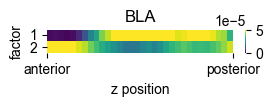

In [161]:
for  idx,sub_acronym in enumerate(target_site_subacronyms):
    sub_factors = [1,2]
    #tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
    tarray = spatial_cell_count_for_subregion[sub_factors,idx,:]
    tarray = tarray[:,~np.isnan(tarray[0,:])]


    fig,axs = plt.subplots(1,1,figsize = (3,0.3))
    sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-5)
    axs.set_title(sub_acronym)
    axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
    axs.set_yticklabels(sub_factors,rotation = 0)
    axs.set_xticks([0,tarray.shape[1]])
    axs.set_xticklabels(['anterior','posterior'])    
    axs.set_ylabel('factor')
    axs.set_xlabel('z position')
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{sub_acronym}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{sub_acronym}.pdf'),bbox_inches='tight',dpi = 512)



# Figure 5: spatial analysis of La

In [162]:
import create_mask_for_region

In [163]:
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)

conduct analysis of Ce distribution

In [165]:
# target site can be experiment specific
target_site_acronym = 'La'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [166]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [167]:
subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()

In [168]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
# append spatial_c

In [169]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [170]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [171]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [172]:
pannel_key = 'N'

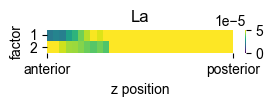

In [175]:
sub_factors = [1,2]
#tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
tarray = spatial_cell_count_for_full[sub_factors,:]
tarray = tarray[:,~np.isnan(tarray[0,:])]


fig,axs = plt.subplots(1,1,figsize = (3,0.3))
sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-5)
axs.set_title(sub_acronym)
axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
axs.set_yticklabels(sub_factors,rotation = 0)
axs.set_xticks([0,tarray.shape[1]])
axs.set_xticklabels(['anterior','posterior'])    
axs.set_ylabel('factor')
axs.set_xlabel('z position')
fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.png'),bbox_inches='tight',dpi = 512)
fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.pdf'),bbox_inches='tight',dpi = 512)



# Figure 5: spatial analysis of VeP

In [290]:
import create_mask_for_region

In [291]:
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)

conduct analysis of VeP distribution

In [292]:
# target site can be experiment specific
target_site_acronym = 'VeP'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [293]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [297]:
z_unique = np.arange(102,131,1) # manually pick the z planes for VeP

In [298]:
subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()

In [299]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
# append spatial_c

In [300]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [301]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [302]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [303]:
# subset to target region
xslice = slice(325,325+120)
yslice = slice(255,255+120)

In [304]:
pannel_key = 'P'

In [305]:
spatial_cell_count_for_full.shape

(22, 29)

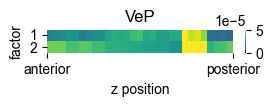

In [306]:
sub_factors = [1,2]
#tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
tarray = spatial_cell_count_for_full[sub_factors,:]
tarray = tarray[:,~np.isnan(tarray[0,:])]


fig,axs = plt.subplots(1,1,figsize = (3,0.3))
sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-5)
axs.set_title(sub_acronym)
axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
axs.set_yticklabels(sub_factors,rotation = 0)
axs.set_xticks([0,tarray.shape[1]])
axs.set_xticklabels(['anterior','posterior'])    
axs.set_ylabel('factor')
axs.set_xlabel('z position')
fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.png'),bbox_inches='tight',dpi = 512)
fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.pdf'),bbox_inches='tight',dpi = 512)



FileNotFoundError: [Errno 2] No such file or directory: 'G:\\My Drive\\Opioid_whole_brain_manuscript\\figure\\Figure5\\Figure5R_LO-2\\3.png'

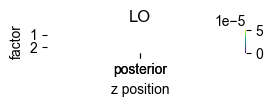

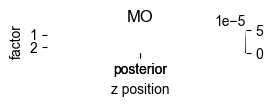

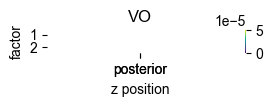

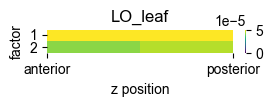

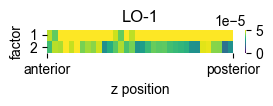

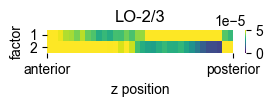

In [324]:
for idx,sub_acronym in enumerate(target_site_subacronyms):
    sub_factors = [1,2]
    #tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
    tarray = spatial_cell_count_for_subregion[sub_factors,idx,:]
    tarray = tarray[:,~np.isnan(tarray[0,:])]


    fig,axs = plt.subplots(1,1,figsize = (3,0.3))
    sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-5)
    axs.set_title(sub_acronym)
    axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
    axs.set_yticklabels(sub_factors,rotation = 0)
    axs.set_xticks([0,tarray.shape[1]])
    axs.set_xticklabels(['anterior','posterior'])    
    axs.set_ylabel('factor')
    axs.set_xlabel('z position')
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{sub_acronym}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{sub_acronym}.pdf'),bbox_inches='tight',dpi = 512)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the 

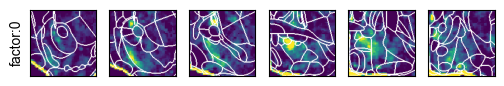

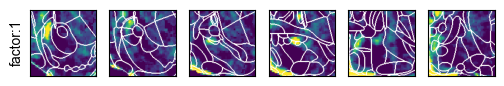

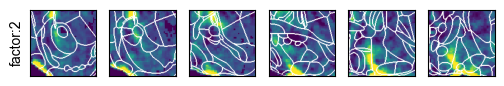

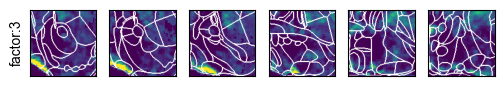

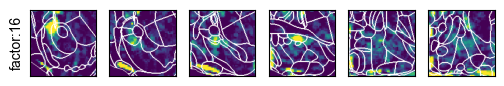

In [307]:
# plot the spatial distribution of starter cells for each subject
pannel_key = 'O'


for cidx, rejected_factor in enumerate(rejected_factor_idx):
    fig, axs = plt.subplots(1, len(z_unique[::5]), figsize=(len(z_unique[::5])*1.0, 1), sharex=True,sharey = True)
    theatmap = factors_da[rejected_factor,:].reshape(atlas_img.shape).compute()
    __,overlayed_image = cv2.overlap_contour(theatmap[:,:,::-1],contour_img,\
        cmin =  0, cmax = 0.00015,\
        outputpath = None,colormap= plt.cm.viridis)
    for idx, curated_zplane in enumerate(z_unique[::5]):
        ax = axs[idx]
        ax.imshow(overlayed_image[curated_zplane,yslice,xslice])
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks
        #ax.axis('off')
        if idx == 0:
            ax.set_ylabel(f'factor:{rejected_factor}', color='black', )
        else:
            ax.set_ylabel('', color='black',)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{rejected_factor}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{rejected_factor}.pdf'),bbox_inches='tight',dpi = 512)

# Figure 5: spatial analysis of OFC

In [325]:
import create_mask_for_region

In [326]:
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)

conduct analysis of OFC distribution

In [327]:
# target site can be experiment specific
target_site_acronym = 'O'
target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values

In [328]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [329]:
subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()

In [330]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
# append spatial_c

In [331]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [332]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [333]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [334]:
# subset to target region
xslice = slice(325,325+120)
yslice = slice(160,160+120)

In [335]:
pannel_key = 'R'

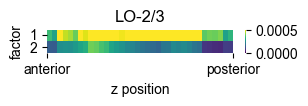

In [336]:
sub_factors = [1,2]
#tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
tarray = spatial_cell_count_for_full[sub_factors,:]
tarray = tarray[:,~np.isnan(tarray[0,:])]


fig,axs = plt.subplots(1,1,figsize = (3,0.3))
sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-4)
axs.set_title(sub_acronym)
axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
axs.set_yticklabels(sub_factors,rotation = 0)
axs.set_xticks([0,tarray.shape[1]])
axs.set_xticklabels(['anterior','posterior'])    
axs.set_ylabel('factor')
axs.set_xlabel('z position')
fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.png'),bbox_inches='tight',dpi = 512)
fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.pdf'),bbox_inches='tight',dpi = 512)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.004874..255.0].
Clipping input data to the 

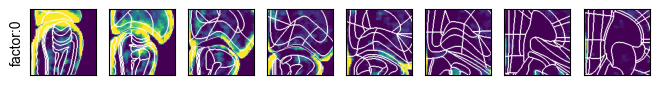

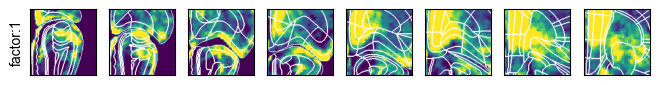

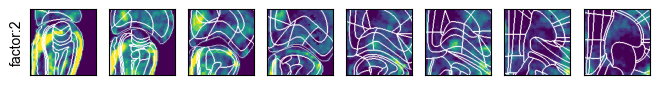

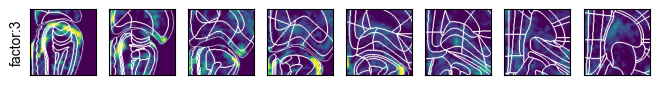

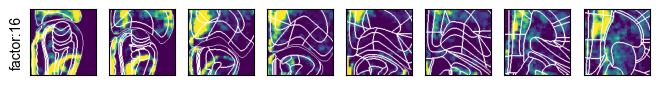

In [337]:
# plot the spatial distribution of starter cells for each subject
pannel_key = 'Q'


for cidx, rejected_factor in enumerate(rejected_factor_idx):
    fig, axs = plt.subplots(1, len(z_unique[::5]), figsize=(len(z_unique[::5])*1.0, 1), sharex=True,sharey = True)
    theatmap = factors_da[rejected_factor,:].reshape(atlas_img.shape).compute()
    __,overlayed_image = cv2.overlap_contour(theatmap[:,:,::-1],contour_img,\
        cmin =  0, cmax = 0.00015,\
        outputpath = None,colormap= plt.cm.viridis)
    for idx, curated_zplane in enumerate(z_unique[::5]):
        ax = axs[idx]
        ax.imshow(overlayed_image[curated_zplane,yslice,xslice])
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks
        #ax.axis('off')
        if idx == 0:
            ax.set_ylabel(f'factor:{rejected_factor}', color='black', )
        else:
            ax.set_ylabel('', color='black',)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{rejected_factor}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{rejected_factor}.pdf'),bbox_inches='tight',dpi = 512)

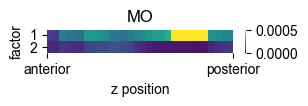

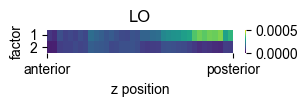

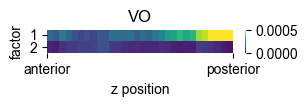

In [364]:
# target site can be experiment specific
#target_site_acronym = 'VO'
for target_site_acronym in ['MO','LO','VO']:
    target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
    target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
    target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values
    # collect all the z positions where there is the target site
    zs = np.array([])
    for ID in target_site_subids:
        z_,y_,x_ = np.where(atlas_img == ID)
        zs = np.concatenate([zs,z_])
    # find the center of mass of the VTA
    z_unique = np.unique(zs).astype('uint16')
    z_center = int(np.mean(zs))
    subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()
    # calculate the spatial distribution of c-Fos+ cells for each subject
    spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
    # append spatial_c
    # calculate cell count for full region
    spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)
    np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
    np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)
    # split the Acumbens into anterior middle posterior
    z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)
    # subset to target region
    xslice = slice(325,325+120)
    yslice = slice(255,255+120)
    pannel_key = 'P'
    sub_factors = [1,2]
    #tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
    tarray = spatial_cell_count_for_full[sub_factors,:]
    tarray = tarray[:,~np.isnan(tarray[0,:])]


    fig,axs = plt.subplots(1,1,figsize = (3,0.3))
    sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-4)
    axs.set_title(target_site_acronym)
    axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
    axs.set_yticklabels(sub_factors,rotation = 0)
    axs.set_xticks([0,tarray.shape[1]])
    axs.set_xticklabels(['anterior','posterior'])    
    axs.set_ylabel('factor')
    axs.set_xlabel('z position')
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.pdf'),bbox_inches='tight',dpi = 512)



# Figure 5: spatial analysis of Insular

In [365]:
import create_mask_for_region

In [366]:
atlas_df = pd.read_csv(r"\\10.159.50.7\Analysis2\Ken\ClearMap\clearmap_ressources_mouse_brain\ClearMap_ressources\Regions_annotations\atlas_info_KimRef_FPbasedLabel_v4.0_brain_with_size_with_curated_with_cleaned_acronyms.csv",index_col = False)

conduct analysis of Insular distribution

In [367]:
# target site can be experiment specific
target_site_acronym = 'Insular'
# for this case the target site is the insular cortex and is defined by acronym AI, GI and DI
# get the ids for these regions and combine them as target_site_ids, 
target_site_ids = atlas_df.loc[atlas_df.acronym.isin(['AI','GI','DI']),'id'].values
# then get target_site_subids for all sub regions of target_site_ids

target_site_subids = [create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values for target_site_id in target_site_ids]


In [368]:
# flatten target_site_subids, a list, into one np array
target_site_subids = np.concatenate(target_site_subids).astype('int')

In [369]:
# collect all the z positions where there is the target site
zs = np.array([])
for ID in target_site_subids:
    z_,y_,x_ = np.where(atlas_img == ID)
    zs = np.concatenate([zs,z_])
# find the center of mass of the VTA
z_unique = np.unique(zs).astype('uint16')
z_center = int(np.mean(zs))

In [371]:
subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()

In [372]:
# calculate the spatial distribution of c-Fos+ cells for each subject
spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
# append spatial_c

In [373]:
# calculate cell count for full region
spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)

In [374]:
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)

In [375]:
# split the Acumbens into anterior middle posterior
z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)

In [376]:
pannel_key = 'T'

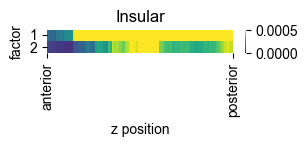

In [377]:
sub_factors = [1,2]
#tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
tarray = spatial_cell_count_for_full[sub_factors,:]
tarray = tarray[:,~np.isnan(tarray[0,:])]


fig,axs = plt.subplots(1,1,figsize = (3,0.3))
sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-4)
axs.set_title(target_site_acronym)
axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
axs.set_yticklabels(sub_factors,rotation = 0)
axs.set_xticks([0,tarray.shape[1]])
axs.set_xticklabels(['anterior','posterior'])    
axs.set_ylabel('factor')
axs.set_xlabel('z position')
fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.png'),bbox_inches='tight',dpi = 512)
fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.pdf'),bbox_inches='tight',dpi = 512)



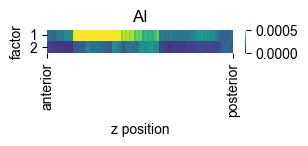

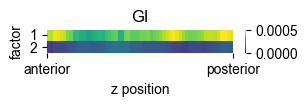

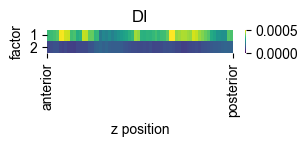

In [382]:
# target site can be experiment specific
for target_site_acronym in ['AI','GI','DI']:
    target_site_id = atlas_df.loc[atlas_df.acronym == target_site_acronym,'id'].values[0]
    target_site_subids = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['id'].values
    target_site_subacronyms = create_mask_for_region.get_subregions(atlas_df,target_site_id,return_original=True)['acronym'].values
    # collect all the z positions where there is the target site
    zs = np.array([])
    for ID in target_site_subids:
        z_,y_,x_ = np.where(atlas_img == ID)
        zs = np.concatenate([zs,z_])
    # find the center of mass of the VTA
    z_unique = np.unique(zs).astype('uint16')
    z_center = int(np.mean(zs))
    subset_heatmap = np.reshape(factors_da,[22] + list(atlas_img.shape)).compute()
    # calculate the spatial distribution of c-Fos+ cells for each subject
    spatial_cell_count_for_subregion = np.array([[[np.nanmean(subset_heatmap[f,z,np.where(atlas_img[z,:,:] == target_site_subid)[0],np.where(atlas_img[z,:,:] == target_site_subid)[1]]) for z in z_unique] for target_site_subid in target_site_subids] for f in range(22)])
    # append spatial_c
    # calculate cell count for full region
    spatial_cell_count_for_full = np.nansum(spatial_cell_count_for_subregion,axis = 1)
    np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_sum_{target_site_acronym}.npy'),spatial_cell_count_for_full,)
    np.save(os.path.join(analysis_resultpath,f'spatial_factors_for_subregion_{target_site_acronym}.npy'),spatial_cell_count_for_subregion,)
    # split the Acumbens into anterior middle posterior
    z_anterior,z_medial,z_posterior = np.array_split(z_unique, 3)
    # subset to target region
    xslice = slice(325,325+120)
    yslice = slice(255,255+120)
    pannel_key = 'P'
    sub_factors = [1,2]
    #tarray = spatial_cell_count_for_subregion[rejected_factor_idx,idx,:]
    tarray = spatial_cell_count_for_full[sub_factors,:]
    tarray = tarray[:,~np.isnan(tarray[0,:])]


    fig,axs = plt.subplots(1,1,figsize = (3,0.3))
    sns.heatmap(tarray,ax = axs,cmap = 'viridis',vmin = 0,vmax= 5E-4)
    axs.set_title(target_site_acronym)
    axs.set_yticks(np.array(range(len(sub_factors))) + 0.5)
    axs.set_yticklabels(sub_factors,rotation = 0)
    axs.set_xticks([0,tarray.shape[1]])
    axs.set_xticklabels(['anterior','posterior'])    
    axs.set_ylabel('factor')
    axs.set_xlabel('z position')
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.png'),bbox_inches='tight',dpi = 512)
    fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_{target_site_acronym}.pdf'),bbox_inches='tight',dpi = 512)



In [ ]:
# plot the spatial distribution of starter cells for each subject
pannel_key = 'S'


for cidx, rejected_factor in enumerate(rejected_factor_idx):
    fig, axs = plt.subplots(1, len(z_unique[::5]), figsize=(len(z_unique[::5])*1.0, 1), sharex=True,sharey = True)
    theatmap = factors_da[rejected_factor,:].reshape(atlas_img.shape).compute()
    __,overlayed_image = cv2.overlap_contour(theatmap[:,:,::-1],contour_img,\
        cmin =  0, cmax = 0.00015,\
        outputpath = None,colormap= plt.cm.coolwarm)
    for idx, curated_zplane in enumerate(z_unique[::5]):
        ax = axs[idx]
        yslice,xslice = get_slice(curated_zplane,target_site_subids,hemi= 'right')
        ax.imshow(overlayed_image[curated_zplane,yslice,xslice])
        ax.set_xticks([])  # Remove x ticks
        ax.set_yticks([])  # Remove y ticks
        #ax.axis('off')
        if idx == 0:
            ax.set_ylabel(f'factor:{rejected_factor}', color='black', )
        else:
            ax.set_ylabel('', color='black',)
    #fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{rejected_factor}.png'),bbox_inches='tight',dpi = 512)
    #fig.savefig(os.path.join(analysis_figurepath,f'{figure_key}{pannel_key}_factor_{rejected_factor}.pdf'),bbox_inches='tight',dpi = 512)

NameError: name 'rejected_factor_idx' is not defined